In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Organizziamo le cartelle per dividere i file IMG e TEXT

In [ ]:
import os
from glob import glob
import shutil


dirpath = 'drive/MyDrive/Colab Notebooks/Animal2'

#creiamo le cartelle img e label
img_dir = os.path.join(dirpath, 'img')
label_dir = os.path.join(dirpath, 'label')
os.makedirs(img_dir, exist_ok=True)
os.makedirs(label_dir, exist_ok=True)



In [ ]:
for dirname in os.listdir(dirpath):
    path=os.path.join(dirpath, dirname)
    file_list = os.listdir(path)
    file_list = sorted(file_list, key=lambda x: int(x.split('.')[0]))
    if path.endswith("img") or path.endswith("label"):
       continue

#ridenominiamo i file
    for file in file_list:
        nome_file, estensione = os.path.splitext(os.path.join(path, file))
        renamed_file = nome_file + "_" + dirname + estensione
        os.rename(os.path.join(path, file), renamed_file)

In [ ]:
for dirname in os.listdir(dirpath):
    path=os.path.join(dirpath, dirname)
    file_list = os.listdir(path)
    if path.endswith("img") or path.endswith("label"):
       continue

    for file in file_list:
        if file.endswith((".txt")):
            shutil.move(os.path.join(path, file), label_dir)

        elif file.endswith((".jpg", ".JPG")):
            shutil.move(os.path.join(path, file), img_dir)

Le immagini hanno le seguenti etichette in base alla classe:
 - 0 --> Buffalo
 - 1 --> Elephant
 - 2 --> Rhino
 - 3 --> Zebra

Dato che label : 0 identifica il Background, aggiungiamo ' +1 ' ad ogni label, così da avere:
 - 1 --> Buffalo
 - 2 --> Elephant
 - 3 --> Rhino
 - 4 --> Zebra

In [ ]:
dirpath = 'drive/MyDrive/Colab Notebooks/Animal2/label'


#cicliamo sulla cartella label
for filename in os.listdir(dirpath):
    filepath = os.path.join(dirpath, filename)
    with open(filepath, 'r') as file:
        lines = file.readlines()

    #Aggiungiamo +1 al primo valore di label di ogni riga
    with open(filepath, 'w') as file:
        for line in lines:
            # Dividi la riga per spazi vuoti
            values = line.split()
            # Incrementa il primo valore e scrivi la riga aggiornata nel file
            values[0] = str(int(values[0]) + 1)
            file.write(' '.join(values) + '\n')


Vediamo quante immagini e label abbiamo collezionato

In [ ]:
print(len(os.listdir(label_dir)))
print(len(os.listdir(img_dir)))

##**INIZIO CODICE PER IL TRAIN**

Carichiamo tutto il necessario per trattare il DATASET

In [ ]:
import os
import numpy as np
import torch
import sys
from PIL import Image

class AnimalDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        self.imgs = list(sorted(os.listdir(os.path.join(root, "img"))))
        self.labels = list(sorted(os.listdir(os.path.join(root, "label"))))

    def __getitem__(self, idx):
        img_path = os.path.join(self.root, "img", self.imgs[idx])
        label_path = os.path.join(self.root, "label", self.labels[idx])

        img = Image.open(img_path).convert("RGB")

        with open(label_path, "r") as label_file:
            lines = label_file.read().splitlines()


        boxes = []
        labels = []
        image_id = torch.tensor([idx])
        for line in lines:
            parts = line.strip().split()
            label = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])
            xmin = (x_center - width / 2.0) * img.width
            ymin = (y_center - height / 2.0) * img.height
            xmax = (x_center + width / 2.0) * img.width
            ymax = (y_center + height / 2.0) * img.height

            boxes.append([xmin, ymin, xmax, ymax])
            labels.append(label)

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)

        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((len(boxes),), dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": image_id,
            "area": area,
            "iscrowd": iscrowd
        }

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)


In [ ]:
from engine import train_one_epoch, evaluate_test, evaluate_train
import utils
import transforms1 as T


def get_transform(train):
    transforms = []
    transforms.append(T.ToTensor())
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

TEST SULL OGGETTO DEL DATASET

In [ ]:
dataset = AnimalDataset('drive/MyDrive/Colab Notebooks/Animal2', get_transform(train=True))
real_image = dataset[1]
real_image

(tensor([[[0.5686, 0.5686, 0.5647,  ..., 0.4196, 0.4196, 0.4196],
          [0.5412, 0.5412, 0.5451,  ..., 0.4078, 0.4078, 0.4000],
          [0.5255, 0.5294, 0.5373,  ..., 0.3922, 0.3922, 0.3882],
          ...,
          [0.7922, 0.8118, 0.8157,  ..., 0.1882, 0.1922, 0.1843],
          [0.7725, 0.7922, 0.7882,  ..., 0.3569, 0.3529, 0.3255],
          [0.8078, 0.8157, 0.8353,  ..., 0.4784, 0.4706, 0.4471]],
 
         [[0.7098, 0.7216, 0.7333,  ..., 0.5569, 0.5451, 0.5333],
          [0.6784, 0.6902, 0.7020,  ..., 0.5333, 0.5216, 0.5059],
          [0.6745, 0.6863, 0.6941,  ..., 0.4980, 0.4902, 0.4784],
          ...,
          [0.7529, 0.7725, 0.7843,  ..., 0.1725, 0.1765, 0.1725],
          [0.7294, 0.7490, 0.7451,  ..., 0.3059, 0.3059, 0.2784],
          [0.7725, 0.7804, 0.7961,  ..., 0.4000, 0.3922, 0.3686]],
 
         [[0.4588, 0.4588, 0.4549,  ..., 0.4706, 0.4627, 0.4549],
          [0.4588, 0.4588, 0.4549,  ..., 0.4510, 0.4431, 0.4314],
          [0.4510, 0.4510, 0.4510,  ...,

FINE TEST OGGETTO DATASET

In [ ]:
import torch
import torchvision
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import requests
from io import BytesIO
import os

Carichiamo il MODELLO Faster R-CNN con backbone resnet50

In [ ]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 218MB/s]


In [ ]:
num_classes = 5

In [ ]:
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)


FINE TEST

Splittiamo il dataset con 70% train, 20% test e 10% validation

In [ ]:
import torch

torch.manual_seed(1)

dataset = AnimalDataset('drive/MyDrive/Colab Notebooks/Animal2', get_transform(train=True))
indices = torch.randperm(len(dataset)).tolist()

len_dataset = len(dataset)
len_train = int(0.7 * len_dataset)
len_val = int(0.1 * len_dataset)
len_test = len_dataset - len_train - len_val

dataset_train = torch.utils.data.Subset(dataset, indices[:len_train])

dataset_val = AnimalDataset('drive/MyDrive/Colab Notebooks/Animal2', get_transform(train=False))
dataset_val = torch.utils.data.Subset(dataset_val, indices[len_train:(len_train + len_val)])

dataset_test = AnimalDataset('drive/MyDrive/Colab Notebooks/Animal2', get_transform(train=False))
dataset_test = torch.utils.data.Subset(dataset_test, indices[(len_train + len_val):])

print("Numero di elementi nel set di addestramento:", len(dataset_train))
print("Numero di elementi nel set di validazione:", len(dataset_val))
print("Numero di elementi nel set di test:", len(dataset_test))

Numero di elementi nel set di addestramento: 1052
Numero di elementi nel set di validazione: 150
Numero di elementi nel set di test: 302


In [ ]:
def count_images_per_class(dataset):
    class_count = {}
    for _, target in dataset:
        labels = target['labels']
        for label in labels:
            label = label.item()
            if label in class_count:
                class_count[label] += 1
            else:
                class_count[label] = 1
    return class_count


train_class_count = count_images_per_class(dataset_train)
val_class_count = count_images_per_class(dataset_val)
test_class_count = count_images_per_class(dataset_test)


print("Dataset di addestramento:")
for label, count in train_class_count.items():
    print(f"Classe {label}: {count} animali")

print("\nDataset di validazione:")
for label, count in val_class_count.items():
    print(f"Classe {label}: {count} animali")

print("\nDataset di test:")
for label, count in test_class_count.items():
    print(f"Classe {label}: {count} animali")


Dataset di addestramento:
Classe 4: 555 animali
Classe 1: 390 animali
Classe 3: 423 animali
Classe 2: 497 animali

Dataset di validazione:
Classe 1: 57 animali
Classe 2: 82 animali
Classe 4: 89 animali
Classe 3: 38 animali

Dataset di test:
Classe 2: 169 animali
Classe 3: 102 animali
Classe 1: 104 animali
Classe 4: 179 animali


Carichiamo i DataLoader

In [ ]:
from torch.utils.data import DataLoader
import utils

data_loader_train = DataLoader(
    dataset_train, batch_size=4, shuffle=True, num_workers=0,
    collate_fn=utils.collate_fn)

data_loader_val = DataLoader(
    dataset_val, batch_size=1, shuffle=False, num_workers=0,
    collate_fn=utils.collate_fn)

data_loader_test = DataLoader(
    dataset_test, batch_size=1, shuffle=False, num_workers=0,
    collate_fn=utils.collate_fn)

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
params   = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                              momentum=0.9, weight_decay=0.001)

lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                step_size=5,
                                                gamma=0.1)

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
from torch.optim.lr_scheduler import StepLR
from torch.utils.tensorboard import SummaryWriter
from os.path import join
import shutil
import os

num_epochs = 20
writer = SummaryWriter(join('logs', 'experiment'))


for epoch in range(num_epochs):
    epoch = epoch
    logger, _ = train_one_epoch(model, optimizer, data_loader_train, device, epoch, print_freq=10, writer = writer)
    lr_scheduler.step()
    var = evaluate_train(model, data_loader_val, device=device, writer=writer, epoch=epoch)
    torch.save(model.state_dict(), '%s_%d.pth' % ('fasterRCNN_checkpoint_', epoch))


#Carichiamo il modello e valutiamolo sul dataset di Test

In [ ]:
checkpoint = torch.load('fasterRCNN_checkpoint__5.pth')
model.load_state_dict(checkpoint)

<All keys matched successfully>

#TEST QUANTITATIVO

In [ ]:
evaluate_test(model, data_loader_test, device=device)

creating index...
index created!
Test:  [  0/302]  eta: 0:11:26  model_time: 2.2518 (2.2518)  evaluator_time: 0.0051 (0.0051)  time: 2.2745  data: 0.0160  max mem: 719
Test:  [100/302]  eta: 0:00:35  model_time: 0.1149 (0.1357)  evaluator_time: 0.0014 (0.0019)  time: 0.1432  data: 0.0247  max mem: 854
Test:  [200/302]  eta: 0:00:16  model_time: 0.1132 (0.1248)  evaluator_time: 0.0015 (0.0019)  time: 0.1658  data: 0.0480  max mem: 854
Test:  [300/302]  eta: 0:00:00  model_time: 0.1093 (0.1198)  evaluator_time: 0.0015 (0.0019)  time: 0.1273  data: 0.0168  max mem: 854
Test:  [301/302]  eta: 0:00:00  model_time: 0.1093 (0.1198)  evaluator_time: 0.0015 (0.0019)  time: 0.1269  data: 0.0169  max mem: 854
Test: Total time: 0:00:46 (0.1532 s / it)
Averaged stats: model_time: 0.1093 (0.1198)  evaluator_time: 0.0015 (0.0019)
Accumulating evaluation results...
DONE (t=0.07s).
IoU metric: bbox
category : 0 : 0.7553648740217778
category : 1 : 0.6933269268613537
category : 2 : 0.8238652777603076
cat

#TEST QUALITATIVO

Test dove carico un'immagine dal dataset di test

In [ ]:
img, target = dataset_test[80]
model.eval()
with torch.no_grad():
 prediction = model([img.to(device)])


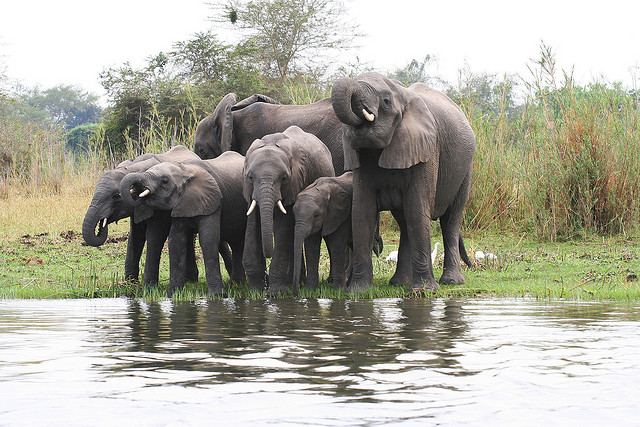

In [ ]:
pred_image = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
pred_image

In [ ]:
threshold = 0.5

Mostriamo il BBox predetto

In [ ]:
plt.figure(figsize=(12,8))
pred_image_np = np.array(pred_image)
plt.imshow(pred_image_np)
ax = plt.gca()
for box, label, score in zip(prediction[0]["boxes"], prediction[0]["labels"], prediction[0]["scores"]):
    if score > threshold:
        x1, y1, x2, y2 = box.cpu().numpy()
        w = x2 - x1
        h = y2 - y1
        rect = plt.Rectangle((x1, y1), w, h, fill=False, color="red")
        ax.add_patch(rect)
        ax.text(x1, y1,  f"{label}:{score:.2f}", fontsize=15, color="white", bbox=dict(facecolor="red", alpha=0.5))
plt.show()

Disegniamo i Bounding Box reali oltre a quelli predetti

In [ ]:
plt.figure(figsize=(12,8))
pred_image_np = np.array(pred_image)
plt.imshow(pred_image_np)
ax = plt.gca()
for box in target['boxes']:
    x1, y1, x2, y2 = box.cpu().numpy()
    w = x2 - x1
    h = y2 - y1
    rect = plt.Rectangle((x1, y1), w, h, fill=False, color="blue")
    ax.add_patch(rect)

for box, label, score in zip(prediction[0]["boxes"], prediction[0]["labels"], prediction[0]["scores"]):
    if score > threshold:
        x1, y1, x2, y2 = box.cpu().numpy()
        w = x2 - x1
        h = y2 - y1
        rect = plt.Rectangle((x1, y1), w, h, fill=False, color="red")
        ax.add_patch(rect)


plt.show()

#Visualizziamo 5 immagini per ogni classe e vediamo le predizioni

In [ ]:
def get_images(dataset_test, label):
  length = len(dataset_test)
  collect = []
  for i in range(0,length):
    bool = True
    check_list = dataset_test[i][1]["labels"]

    for k in range(0,len(check_list)):
      if check_list[k] != label:
        bool = False
        break

    if bool == True:
      img, _ = dataset_test[i]
      collect.append(img)

    if len(collect) == 5:
      return collect

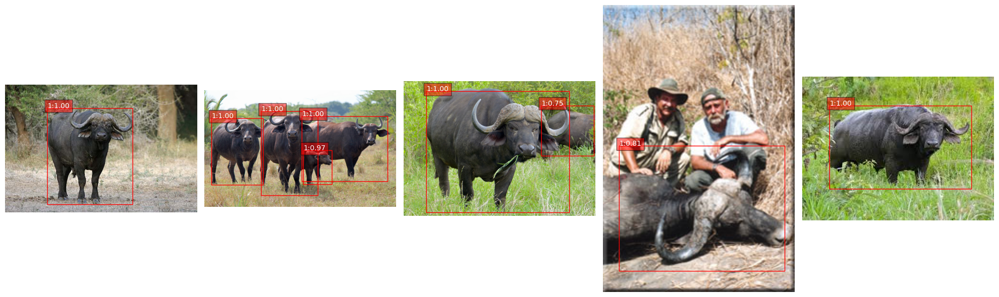

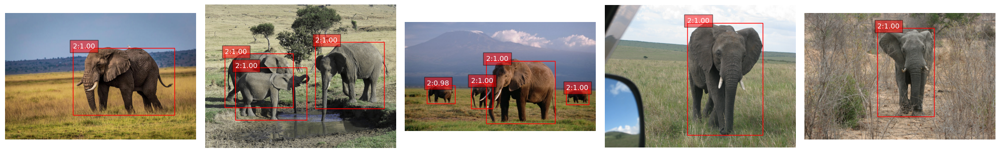

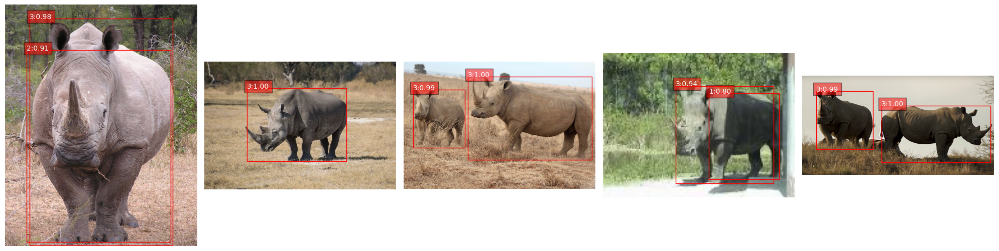

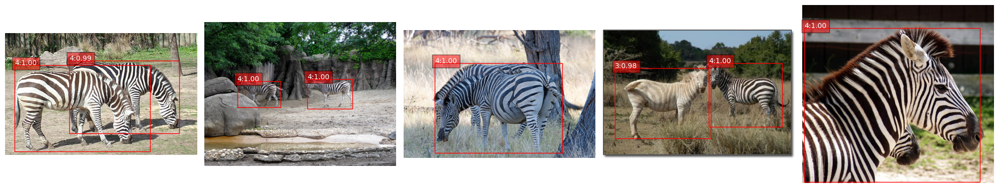

In [ ]:
columns = 5
rows = (5 + 1)
model.eval()

for i in range(1,5):
    plt.figure(figsize=(20, 12))
    list_img = get_images(dataset_test, i)

    for k in range(0,len(list_img)):
      print("\n")
      with torch.no_grad():
        prediction = model([list_img[k].to(device)])

      pred_image = Image.fromarray(list_img[k].mul(255).permute(1, 2, 0).byte().numpy())
      pred_image_np = np.array(pred_image)
      ax = plt.subplot(rows, columns, k+1)
      ax.imshow(pred_image_np)


      for box, label, score in zip(prediction[0]["boxes"], prediction[0]["labels"], prediction[0]["scores"]):
          if score > threshold:
              x1, y1, x2, y2 = box.cpu().numpy()
              w = x2 - x1
              h = y2 - y1
              rect = plt.Rectangle((x1, y1), w, h, fill=False, color="red")
              ax.add_patch(rect)
              ax.text(x1, y1, f"{label}:{score:.2f}", fontsize=10, color="white", bbox=dict(facecolor="red", alpha=0.5))


      ax.axis('off')
    plt.tight_layout()
    plt.show()



#Visualizziamo 5 immagini random e vediamo le predizioni

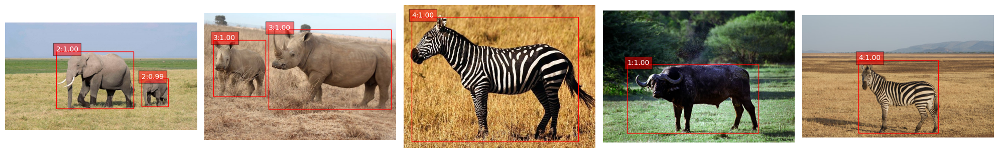

In [ ]:
import random

random.seed(42)

random_indices = random.sample(range(len(dataset_test)), 5)

plt.figure(figsize=(20, 12))
columns = 5
rows = (5 + 1)

for idx, image_idx in enumerate(random_indices):

    img, target = dataset_test[image_idx]
    with torch.no_grad():
        prediction = model([img.to(device)])

    pred_image = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
    pred_image_np = np.array(pred_image)
    ax = plt.subplot(rows, columns, idx + 1)   #dividiamo il subplot
    ax.imshow(pred_image_np)


    for box, label, score in zip(prediction[0]["boxes"], prediction[0]["labels"], prediction[0]["scores"]):
        if score > threshold:
            x1, y1, x2, y2 = box.cpu().numpy()
            w = x2 - x1
            h = y2 - y1
            rect = plt.Rectangle((x1, y1), w, h, fill=False, color="red")
            ax.add_patch(rect)
            ax.text(x1, y1, f"{label}:{score:.2f}", fontsize=10, color="white", bbox=dict(facecolor="red", alpha=0.5))


    ax.axis('off')

plt.tight_layout()
plt.show()

